# VARSHINI CH P D R 
Data Science Intern @ The Sparks Foundation (Graduate Rotational Internship Program (GRIP) April2023 Batch)

Task-4 Perform ‘Exploratory Data Analysis’ on dataset ‘Global Terrorism'
- As a security/defense analyst, try to find out the hot zone of terrorism.
- What all security issues and insights you can derive by EDA?

In [1]:
## C:\Users\shiva\Downloads\Global Terrorism - START data

In [2]:
#import the important libraries
import pandas as pd
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
import seaborn as sns
%matplotlib inline

In [3]:
#read the dataset
df= pd.read_csv("C:/Users/shiva/Downloads/Global Terrorism - START data/globalterrorismdb_0718dist.csv", encoding = "ISO-8859-1")
df.head(3)

C:\Users\shiva\AppData\Local\Temp\ipykernel_2824\352426573.py:2: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df= pd.read_csv("C:/Users/shiva/Downloads/Global Terrorism - START data/globalterrorismdb_0718dist.csv", encoding = "ISO-8859-1")


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


# Data Preprocessing

In [4]:
df.shape ###135 columns **

(181691, 135)

We can see that we have around 135 coulumns.
We aim at finding the hot zones so we can drop outher columns.

#Rename the necessary columns 


In [5]:
df.rename(columns={'iyear':'Year','imonth':'Month','city':'City','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
df['Casualities'] = df.Killed + df.Wounded
df=df[['Year','Month','Day','Country','Region','City','latitude','longitude','AttackType','Killed','Wounded','Casualities','Target','Group','Target_type','Weapon_type']]
df.head(5)

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary


Check for missing data

In [6]:
df.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
City             434
latitude        4556
longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Casualities    16874
Target           636
Group              0
Target_type        0
Weapon_type        0
dtype: int64

In [7]:
##Remove columns with missing data 
df.dropna(axis=0, inplace=True)
df.shape

(159946, 16)

In [8]:
df.isnull().sum() ##Rechecking missing data 

Year           0
Month          0
Day            0
Country        0
Region         0
City           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Casualities    0
Target         0
Group          0
Target_type    0
Weapon_type    0
dtype: int64

# EXPLORATORY DATA ANALYSIS

Yearly Count of Terrorist Attack-

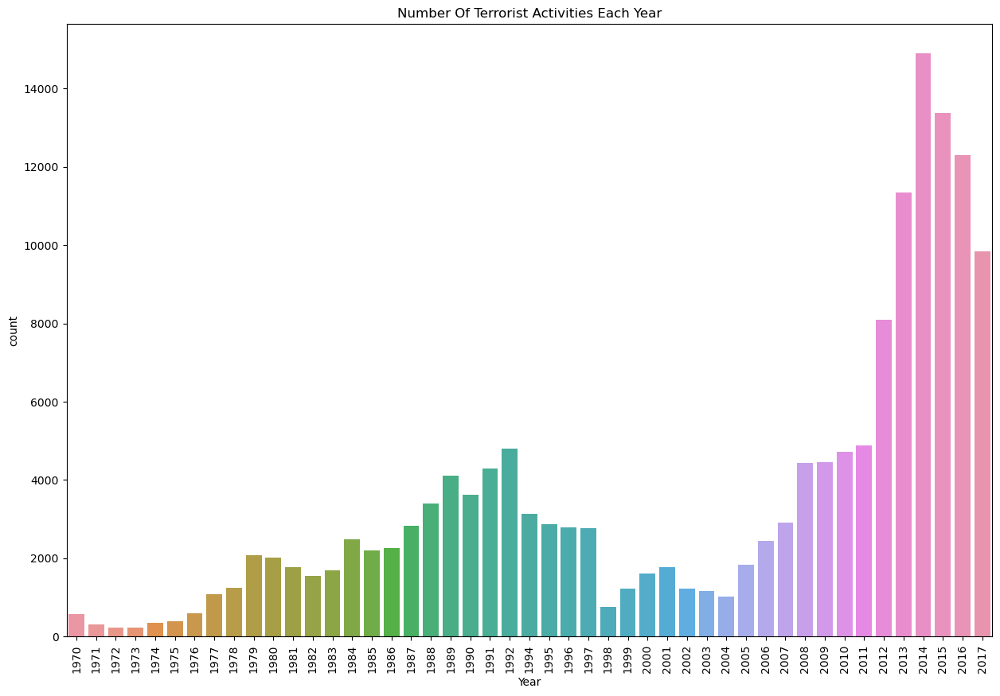

In [9]:
plt.figure(figsize=(15, 10))
sns.countplot(x="Year", data=df)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

There has been a gradual increase in Terror Activities since 2005.
Highest number of terror activities occurred in the year 2014.
After 2014 the terror activities started to decrease.

In [10]:
##Counting the Yearly Casualities-
year_cas = df.groupby('Year').Casualities.sum().to_frame().reset_index()
year_cas.columns = ['Year','Casualities']
px.bar(data_frame=year_cas,x = 'Year',y = 'Casualities',color='Casualities')

It is observed that 2015 marks the highest Casualities records.

In [11]:
#Target type count 
target = list(df['Target_type'])
target_map = dict(Counter(target))
target_df = pd.DataFrame(target_map.items())
target_df.columns = ['Target Type','Count']

In [12]:
px.bar(data_frame=target_df,x = 'Target Type',y = 'Count',color='Target Type')

Private Citizens and Property Counts the highest amongst all.

In [13]:
#Analysing the Type of Attacks:-¶
#Counting the Casuallities according the Attack Type
AttackType=df.pivot_table(columns='AttackType',values='Casualities',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index


In [14]:
#plotting the Attack Type
labels = AttackType.columns.tolist()
attack=AttackType.T
values=attack.values.tolist()
values = sum(values,[])
attack_type = list(df['AttackType'].unique())
fig = go.Figure(data=[go.Pie(labels = attack_type,values=values,hole=.3)])
fig.show()

Bombing and Explosion method shows the highest chossen type.

In [15]:
from collections import Counter
values = list(df['AttackType'])
value_map = dict(Counter(values))
value_df = pd.DataFrame(value_map.items())
value_df.columns = ["AttackType","Count of Attack Type"]
px.bar(data_frame=value_df,x = 'AttackType',y = 'Count of Attack Type',color = 'AttackType')

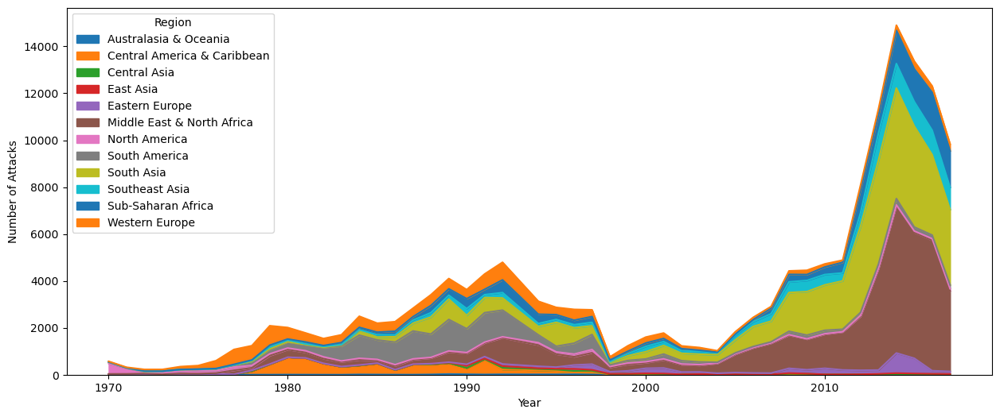

In [16]:
#Terrorist Activities in each Year w.r.t region
pd.crosstab(df.Year, df.Region).plot(kind='area',figsize=(15,6))
plt.ylabel('Number of Attacks')
plt.show()

Maximum Attacks have been in Central America, followed by Australasia in the year 2010.
There have been very less terror casualties in: East Asia, North America.
In East Asia the number of attack gradually reduced to 0 after the year 1990.

In [17]:
import folium
from folium.plugins import MarkerCluster
year=df[df['Year']==2014]
mapData=year.loc[:,'City':'longitude']
mapData=mapData.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(mapData)):
    folium.Marker(location=[mapData[point][1],mapData[point][2]],
                  popup = mapData[point][0]).add_to(markerCluster)

In [18]:
map

IRAQ shows the highest Terror Attacks followed by other Middle-east region.

In [19]:
#Top 15 Countries showing the Highest Terror Attack.¶
plt.figure(figsize=(15,6))
country_attack=df.Country.value_counts()[:15].reset_index()
country_attack.columns= ["Country", "Total Attacks"]
px.bar(data_frame= country_attack,x = 'Country',y = 'Total Attacks',color = 'Country')

<Figure size 1500x600 with 0 Axes>

Iraq, again the highest followed by Pakistan, Afganistan and India.

In [20]:
weapon_cross = pd.crosstab(df["Weapon_type"], df["Region"])
weapon_cross

Region,Australasia & Oceania,Central America & Caribbean,Central Asia,East Asia,Eastern Europe,Middle East & North Africa,North America,South America,South Asia,Southeast Asia,Sub-Saharan Africa,Western Europe
Weapon_type,,,,,,,,,,,,
Biological,0,0,0,2,0,0,23,1,2,0,1,1
Chemical,11,1,1,17,12,60,23,20,78,11,11,31
Explosives,71,2176,250,305,2941,30192,1467,7822,21852,4704,5327,7582
Fake Weapons,0,0,1,4,4,5,4,3,2,0,1,5
Firearms,70,3907,215,41,1362,10692,657,5727,13987,4956,5892,2350
Incendiary,73,268,15,234,175,1077,879,950,2158,797,642,2813
Melee,10,62,14,76,87,1115,74,118,907,133,397,284
Other,0,0,0,3,3,23,18,5,16,4,17,20
Radiological,0,0,0,10,0,0,1,0,0,0,0,2


Mostly there is usage of Explosives and Firearms.

# CONCLUSION

In [21]:
#Evaluating
print("Country with the most attacks:",df['Country'].value_counts().idxmax())
print("City with the most attacks:",df['City'].value_counts().index[1]) 
print("Region with the most attacks:",df['Region'].value_counts().idxmax())
print("Year with the most attacks:",df['Year'].value_counts().idxmax())
print("Month with the most attacks:",df['Month'].value_counts().idxmax())
print("Group with the most attacks:",df['Group'].value_counts().index[1])
print("Most Attack Types:",df['AttackType'].value_counts().idxmax())
print("Most Target Types:",df['Target_type'].value_counts().idxmax())

Country with the most attacks: Iraq
City with the most attacks: Unknown
Region with the most attacks: Middle East & North Africa
Year with the most attacks: 2014
Month with the most attacks: 5
Group with the most attacks: Taliban
Most Attack Types: Bombing/Explosion
Most Target Types: Private Citizens & Property
